# Coded aperture imaging: PSF, MTF and deblurring

A normal (disc) lens aperture has an MTF
that goes to zero at several spatial frequencies. Anywhere it hits zero,
the information at that frequency is gone, not just attenuated, and no
amount of clever deconvolution can bring it back. A *coded* aperture
(Zhou & Nayar, ICCP 2009) trades the disc's clean rotationally-symmetric
blur for a messier PSF whose MTF has no clean nulls, at the cost of a
slightly larger blur footprint for a fair light budget. This notebook
builds up, from first principles, why that trade is worth making.

Sections:
1. Disc aperture PSF/MTF, and checking the jinc-zero prediction
2. MTF scaling with blur size
3. Blurring real images (the cameraman photo + a Siemens star)
4. Coded aperture PSF/MTF and how it compares to the disc
5. Naive deblurring (`X_hat = Y / H`) and why noise breaks it
6. The Wiener filter, and sweeping its regularisation parameter K
7. Disc vs coded, both Wiener-deblurred, side by side
8. (Optional) spatial-domain deconvolution and why nobody does it that way


In [1]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

ASSETS = Path("assets/Lec5")   # run the notebook from the LectureCode/ folder

plt.rcParams['figure.dpi'] = 100
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['axes.linewidth'] = 1.1

CMP = 'equalArea'    # 'equalArea'     : coded mask scaled to match the disc's open area
                      # 'equalDiameter' : coded mask fills the same envelope as the disc

D0 = 32               # nominal defocus blur diameter, pixels
N  = 512              # working image size
NoiseLevel = 1e-4     # noise standard deviation, in units of the [0, 1] signal

print(f'setup: nominal blur diameter {D0} px, comparison mode {CMP}')

setup: nominal blur diameter 32 px, comparison mode equalArea


## Core functions

These mirror the local functions at the bottom of the MATLAB script. Grouped
here up front so the experiment cells below read like a narrative rather
than a function dump.

**Apertures and PSFs**

In [2]:
def disc_psf(D):
    '''Unit-sum disc PSF of diameter D pixels, on an odd-sized support.'''
    r = int(np.ceil(D / 2)) + 1
    idx = np.arange(-r, r + 1)
    xx, yy = np.meshgrid(idx, idx)
    p = ((xx**2 + yy**2) <= (D / 2)**2).astype(float)
    return p / p.sum()


def zhou_nayar_mask():
    '''13x13, 1 = open. Transcribed from Zhou & Nayar ICCP 2009 Fig 3.'''
    rows = [
        '0000000000000',
        '0001011111000',
        '0000000110000',
        '0101000111110',
        '0100111100010',
        '0110000001010',
        '0110111001000',
        '0110100011010',
        '0110100000010',
        '0110010100110',
        '0011100111100',
        '0000000111000',
        '0000000000000',
    ]
    return np.array([[int(c) for c in row] for row in rows], dtype=float)


def coded_psf(Dref, mode='equalArea'):
    '''Zhou & Nayar mask, scaled either to the disc's envelope diameter or
    to its open AREA (equal photons, the fair-light comparison).'''
    M = zhou_nayar_mask()
    tau = M.mean()                     # open fraction inside the square
    disc_area = np.pi * (Dref / 2)**2
    mode_l = mode.lower()
    if mode_l == 'equaldiameter':
        Denv = Dref
    elif mode_l == 'equalarea':
        Denv = round(np.sqrt(disc_area / tau))
    else:
        raise ValueError('mode must be equalArea or equalDiameter')
    Denv = max(Denv, 13)                # keep at least 1 px per cell

    img = Image.fromarray(M.astype(np.float32), mode='F')
    img = img.resize((Denv, Denv), resample=Image.NEAREST)
    p = np.array(img, dtype=float)
    p = (p > 0.5).astype(float)
    if p.shape[0] % 2 == 0:
        p = np.pad(p, ((0, 1), (0, 1)))
    return p / p.sum(), Denv

**OTF / MTF**

In [3]:
def otf(psf, N):
    '''OTF on an N x N grid, normalised so H(0) = 1 (the PSF already sums to 1).'''
    P = np.zeros((N, N))
    s = psf.shape[0]
    o = N // 2 - s // 2
    P[o:o + s, o:o + s] = psf
    P = np.fft.ifftshift(P)
    return np.fft.fft2(P)


def band_mtf(psf, N):
    '''For each radius: the MIN, MEAN and MAX of the MTF over all orientations.
    The disc is rotationally symmetric so its band collapses to a line, and its
    nulls are whole rings. The coded mask's weak spots are isolated in angle, so
    its band stays open even where its minimum dips.'''
    H = np.fft.fftshift(np.abs(otf(psf, N)))
    c = N // 2
    idx = np.arange(N) - c
    xx, yy = np.meshgrid(idx, idx)
    rr = np.sqrt(xx**2 + yy**2)
    nb = N // 2
    fr = np.zeros(nb); lo = np.zeros(nb); mid = np.zeros(nb); hi = np.zeros(nb)
    for k in range(1, nb + 1):
        sel = (rr >= k - 1) & (rr < k)
        v = H[sel]
        lo[k - 1] = v.min(); mid[k - 1] = v.mean(); hi[k - 1] = v.max()
        fr[k - 1] = (k - 0.5) / N
    d = mid[0]
    return fr, lo / d, mid / d, hi / d


def first_null(fr, m):
    '''Frequency of the first local minimum that is essentially zero.'''
    for k in range(1, len(m) - 1):
        if m[k] < m[k - 1] and m[k] < m[k + 1] and m[k] < 0.05:
            return fr[k]
    return np.nan

**Images and targets**

In [4]:
def natural_image(N):
    '''The classic cameraman test image (assets/Lec5/cameraman.png), resized
    to N x N and normalised to [0, 1]. Stands in for MATLAB's cameraman.tif.'''
    a = Image.open(ASSETS / "cameraman.png").convert("L")
    a = a.resize((N, N), resample=Image.BICUBIC)
    a = np.asarray(a, dtype=float)
    return (a - a.min()) / (a.max() - a.min())


def star_cycles():
    '''Cycles around the Siemens star. Fewer = chunkier spokes.'''
    return 36


def resolution_target(N):
    '''Siemens star. Local frequency is NCYC/(2*pi*r), so it falls smoothly with
    radius: an MTF null becomes a grey ring at a predictable radius, and the
    contrast reversal past each null shows as the spokes swapping polarity.'''
    NCYC = star_cycles()
    idx = np.arange(N) - N / 2
    xx, yy = np.meshgrid(idx, idx)
    th = np.arctan2(yy, xx)
    rr = np.hypot(xx, yy)
    t = 0.5 + 0.5 * np.sign(np.sin(NCYC * th))
    r_alias = NCYC / (2 * np.pi * 0.5)      # inside this radius the star aliases
    t[rr < max(r_alias, 14)] = 0.5           # blank the core
    t[rr > N / 2 - 6] = 0.5                  # and the corners
    return np.clip(t, 0, 1)


def report_star_rings(N, D):
    '''Where the grey rings should appear in the blurred star, from the jinc zeros.'''
    J1 = np.array([3.8317, 7.0156, 10.1735, 13.3237, 16.4706])
    fn = J1 / (np.pi * D)
    r = star_cycles() / (2 * np.pi * fn)
    print(f'star rings (D = {D} px, {star_cycles()} cycles):')
    for k in range(len(fn)):
        note = '' if r[k] < N / 2 - 6 else '   (outside the frame)'
        print(f'   null f = {fn[k]:.4f} cyc/px  ->  grey ring at r = {r[k]:.0f} px{note}')


def blur_fft(x, psf):
    '''Blur in the frequency domain, with symmetric padding so the DFT's
    circular wrap-around does not contaminate the edges.'''
    pad = psf.shape[0]
    xp = np.pad(x, pad, mode='symmetric')
    H = otf(psf, xp.shape[0])
    yp = np.real(np.fft.ifft2(np.fft.fft2(xp) * H))
    return yp[pad:pad + x.shape[0], pad:pad + x.shape[1]]

**Display helpers**

In [5]:
def robust_lim(a):
    '''Percentile display limits, so one huge outlier does not flatten the image.'''
    v = np.sort(a.ravel())
    n = len(v)
    lo = v[max(1, round(0.02 * n)) - 1]
    hi = v[min(n, round(0.98 * n)) - 1]
    if hi <= lo:
        hi = lo + np.finfo(float).eps
    return lo, hi


def show_aperture(psf, N, title):
    H = otf(psf, N)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(psf, cmap='gray'); axes[0].axis('off')
    axes[0].set_title(f'PSF: {title}')
    mtf_db = 20 * np.log10(np.fft.fftshift(np.abs(H)) + 1e-6)
    im = axes[1].imshow(mtf_db, cmap='viridis', vmin=-60, vmax=0)
    axes[1].axis('off'); axes[1].set_title('MTF, dB (2D)')
    fig.colorbar(im, ax=axes[1], fraction=0.046)
    plt.tight_layout(); plt.show()


def show_mtf_band(sets, labels, xl, title, fmark=None):
    '''sets: list of (fr, lo, mid, hi); pass lo = hi = None for a plain line.'''
    colors = plt.cm.tab10(np.linspace(0, 1, len(sets)))
    fig, axes = plt.subplots(2, 1, figsize=(8, 8))
    for pass_idx, ax in enumerate(axes):
        for k, (fr, lo, mid, hi) in enumerate(sets):
            m = fr <= xl[1]
            if lo is not None:
                ax.fill_between(fr[m], np.maximum(lo[m], 1e-6), np.maximum(hi[m], 1e-6),
                                 color=colors[k], alpha=0.20, edgecolor='none')
            ax.plot(fr[m], np.maximum(mid[m], 1e-6), lw=1.8, color=colors[k], label=labels[k])
        if fmark is not None and not np.isnan(fmark):
            ax.axvline(fmark, color='k', ls='--')
        ax.set_xlim(xl[0], xl[1]); ax.grid(True)
        if pass_idx == 1:
            ax.set_yscale('log'); ax.set_ylim(1e-5, 1.5); ax.set_ylabel('MTF (log)')
        else:
            ax.set_ylim(0, xl[2]); ax.set_ylabel('MTF'); ax.set_title(title)
        ax.set_xlabel('spatial frequency, cycles/pixel')
        ax.legend(loc='upper right')
    plt.tight_layout(); plt.show()


def show_spec(ax, x, fNull=None):
    N = x.shape[0]
    S = np.fft.fftshift(np.abs(np.fft.fft2(x)))
    S = S - S.min(); S = S / S.max()
    ax.imshow(20 * np.log10(S + 1e-6), cmap='viridis')
    ax.axis('off')
    if fNull is not None and not np.isnan(fNull):
        c = N // 2
        r = fNull * N
        th = np.linspace(0, 2 * np.pi, 256)
        ax.plot(c + r * np.cos(th), c + r * np.sin(th), 'r--', lw=1.2)


def show_image_demo(x, psf, title, fNull=None):
    y = blur_fft(x, psf)
    fig, axes = plt.subplots(2, 2, figsize=(9, 9))
    axes[0, 0].imshow(x, cmap='gray', vmin=0, vmax=1); axes[0, 0].axis('off'); axes[0, 0].set_title('sharp')
    axes[0, 1].imshow(y, cmap='gray', vmin=0, vmax=1); axes[0, 1].axis('off'); axes[0, 1].set_title(title)
    show_spec(axes[1, 0], x, fNull); axes[1, 0].set_title('spectrum, sharp')
    show_spec(axes[1, 1], y, fNull); axes[1, 1].set_title('spectrum, blurred')
    plt.tight_layout(); plt.show()
    return y

## 1. Disc aperture: PSF and 2D MTF

A defocused circular aperture produces a disc PSF (a "pillbox"). Its MTF is
the Fourier transform of that disc, which is a jinc function: a
rotationally symmetric ring pattern with well-defined zeros. The first zero
sits at `f = 1.2197 / D` cycles/pixel, where `D` is the disc diameter in
pixels — this is the diffraction-free, purely geometric analogue of the
Airy pattern's first dark ring.

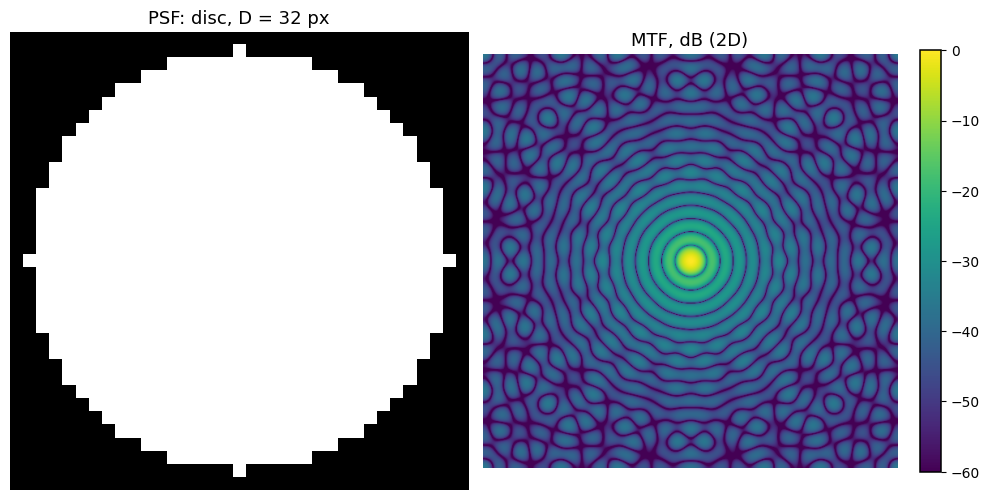

In [6]:
psf_disc = disc_psf(D0)
show_aperture(psf_disc, N, f'disc, D = {D0} px')

Check the jinc-zero prediction against what the 2D MTF actually measures:

In [7]:
f_null_pred = 1.2197 / D0
fr_tmp, _, mid_tmp, _ = band_mtf(psf_disc, N)
f_null_meas = first_null(fr_tmp, mid_tmp)
print(f'disc first null: predicted {f_null_pred:.4f}, measured {f_null_meas:.4f} cyc/px '
      f'(ratio {f_null_meas / f_null_pred:.3f})')

disc first null: predicted 0.0381, measured 0.0381 cyc/px (ratio 0.999)


## 2. Disc MTF in 1D, with the nulls marked

`band_mtf` sweeps every radius and reports the min/mean/max of the MTF over
all orientations at that radius. Because the disc is rotationally
symmetric, the band collapses to a single line — its nulls are whole
rings, not just isolated angles.

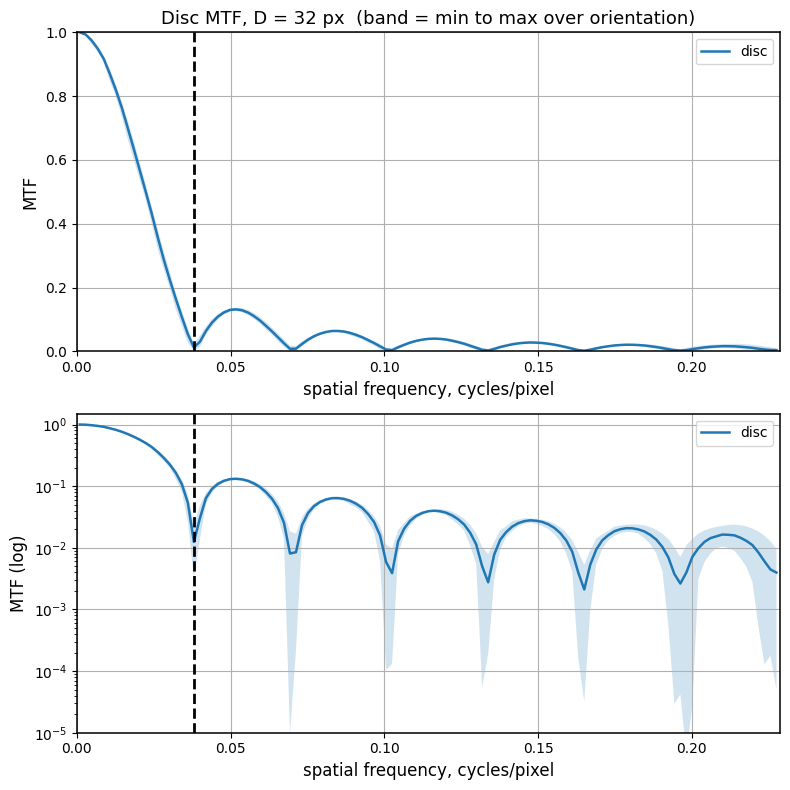

In [8]:
fr, lo_d, mid_d, hi_d = band_mtf(psf_disc, N)
show_mtf_band([(fr, lo_d, mid_d, hi_d)], ['disc'], [0, 6 * f_null_pred, 1],
              f'Disc MTF, D = {D0} px  (band = min to max over orientation)',
              f_null_pred)

## 3. MTF scales inversely with the blur

Doubling the blur diameter halves every feature of the MTF in frequency —
the null moves inward proportionally to `1/D`.

D = 12 px : first null predicted 0.1016, measured 0.1025 cyc/px
D = 24 px : first null predicted 0.0508, measured 0.0518 cyc/px
D = 48 px : first null predicted 0.0254, measured 0.0264 cyc/px


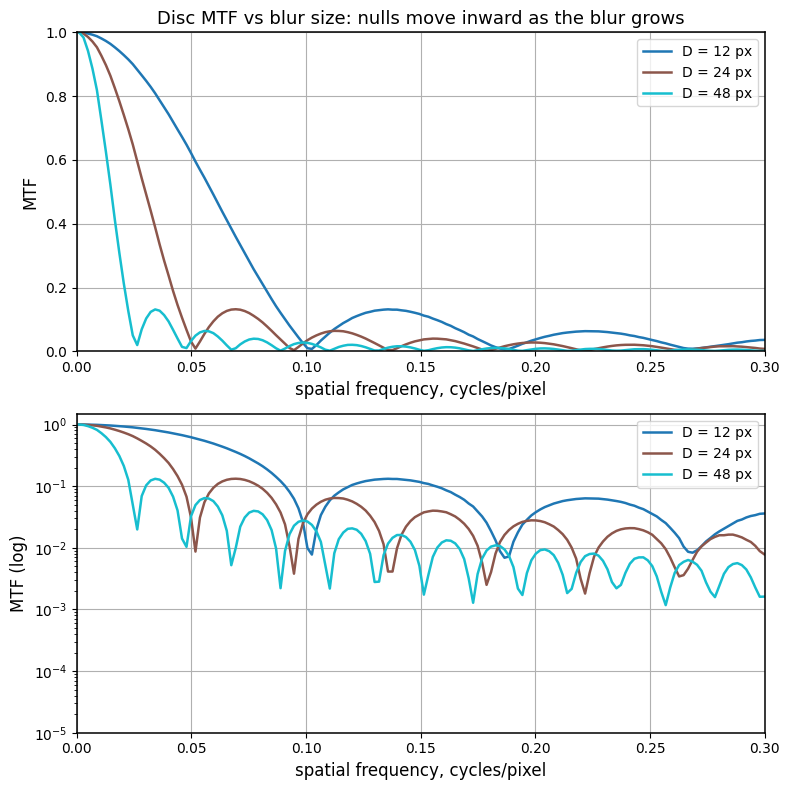

In [9]:
Ds = [12, 24, 48]
sets, labs = [], []
for Dk in Ds:
    fr_k, _, mid_k, _ = band_mtf(disc_psf(Dk), N)
    sets.append((fr_k, None, mid_k, None))
    labs.append(f'D = {Dk} px')
    print(f'D = {Dk:2d} px : first null predicted {1.2197 / Dk:.4f}, '
          f'measured {first_null(fr_k, mid_k):.4f} cyc/px')

show_mtf_band(sets, labs, [0, 0.30, 1],
              'Disc MTF vs blur size: nulls move inward as the blur grows', None)

## 4. Apply the disc blur to a natural image, and to a resolution target

The cameraman image (`assets/Lec5/cameraman.png`, the classic test image)
shows the blur qualitatively. The Siemens star
is more diagnostic: its local spatial frequency falls off smoothly with
radius as `NCYC / (2*pi*r)`, so an MTF null shows up as a clean grey ring
at a predictable radius, with the spokes swapping contrast polarity just
past it.

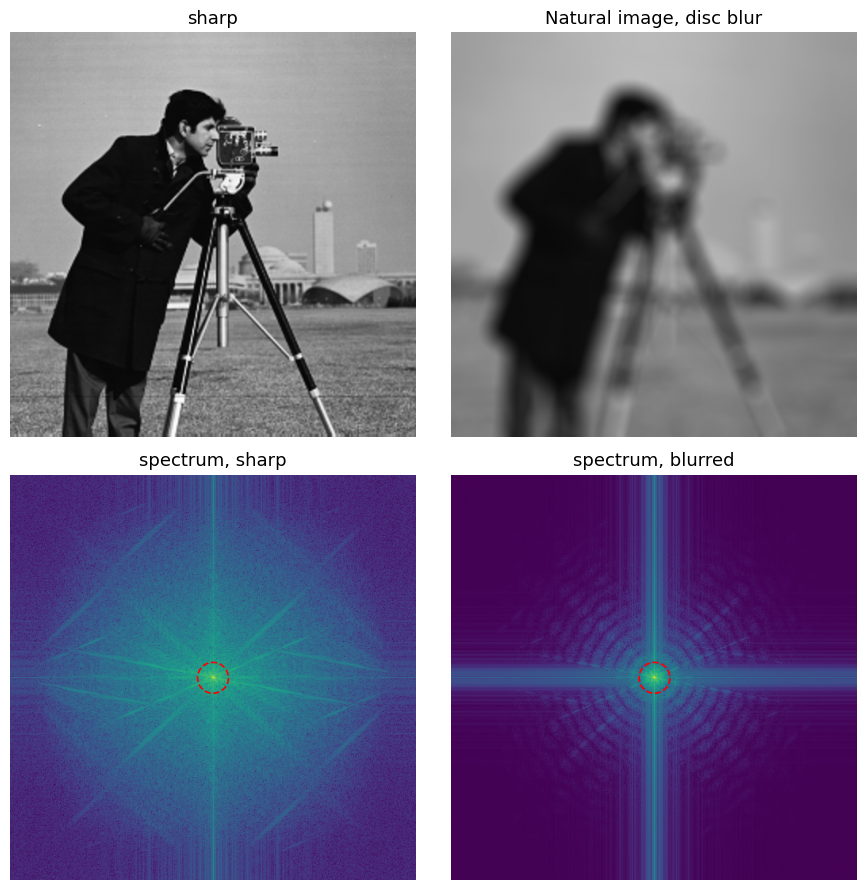

In [10]:
img = natural_image(N)
_ = show_image_demo(img, psf_disc, 'Natural image, disc blur', f_null_meas)

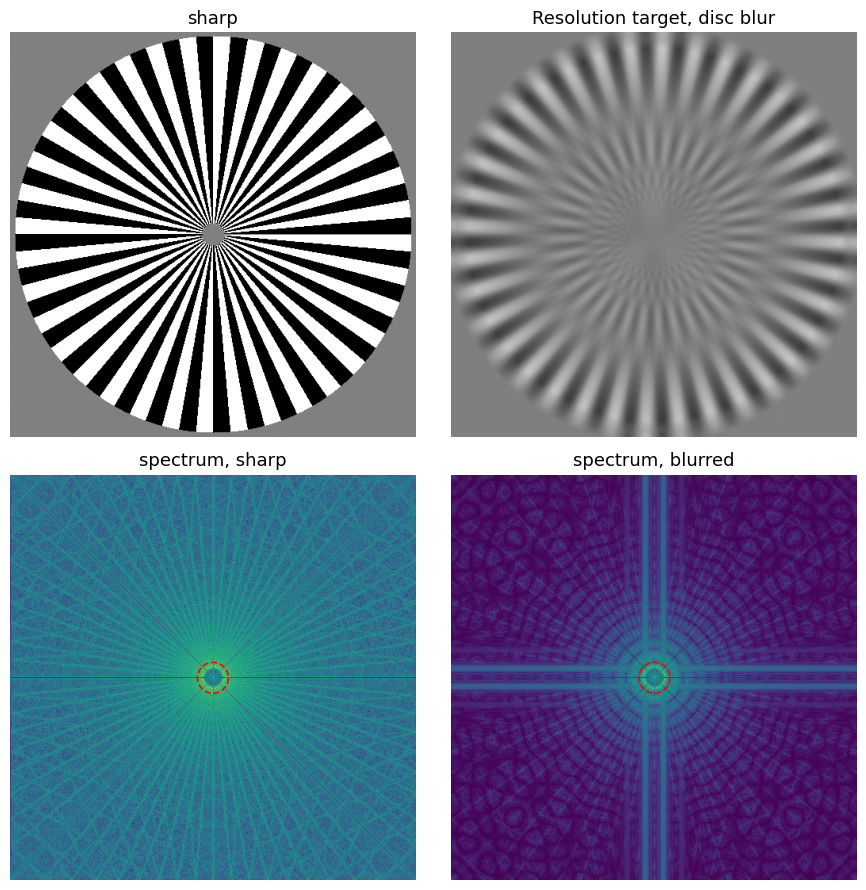

star rings (D = 32 px, 36 cycles):
   null f = 0.0381 cyc/px  ->  grey ring at r = 150 px
   null f = 0.0698 cyc/px  ->  grey ring at r = 82 px
   null f = 0.1012 cyc/px  ->  grey ring at r = 57 px
   null f = 0.1325 cyc/px  ->  grey ring at r = 43 px
   null f = 0.1638 cyc/px  ->  grey ring at r = 35 px


In [11]:
tgt = resolution_target(N)
_ = show_image_demo(tgt, psf_disc, 'Resolution target, disc blur', f_null_meas)
report_star_rings(N, D0)

## 5. Coded aperture: PSF and 2D MTF

The Zhou & Nayar mask (ICCP 2009) is a 13x13 binary pattern with no
rotational symmetry. Scaled to `CMP = 'equalArea'`, its open area matches
the disc's — the fair comparison, since it lets in the same number of
photons for the same exposure. Notice in the 2D MTF plot below that there
is no ring of exact zero: the deep spots are isolated points in
frequency-angle space, not whole rings.

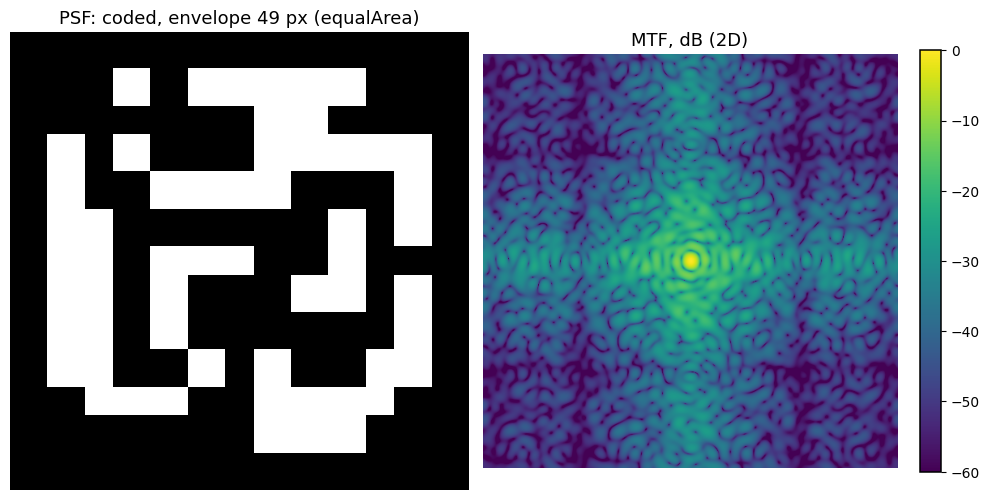

In [12]:
psf_coded, D_coded = coded_psf(D0, CMP)
show_aperture(psf_coded, N, f'coded, envelope {D_coded} px ({CMP})')

## 6. Disc vs coded, 1D, with the orientation band shown

This is the central plot of the whole notebook. The disc's band collapses
to a line with hard zeros. The coded aperture's *mean* MTF also dips, but
its band (min to max over orientation) never touches zero — there is
always some orientation at each radius that still carries signal.

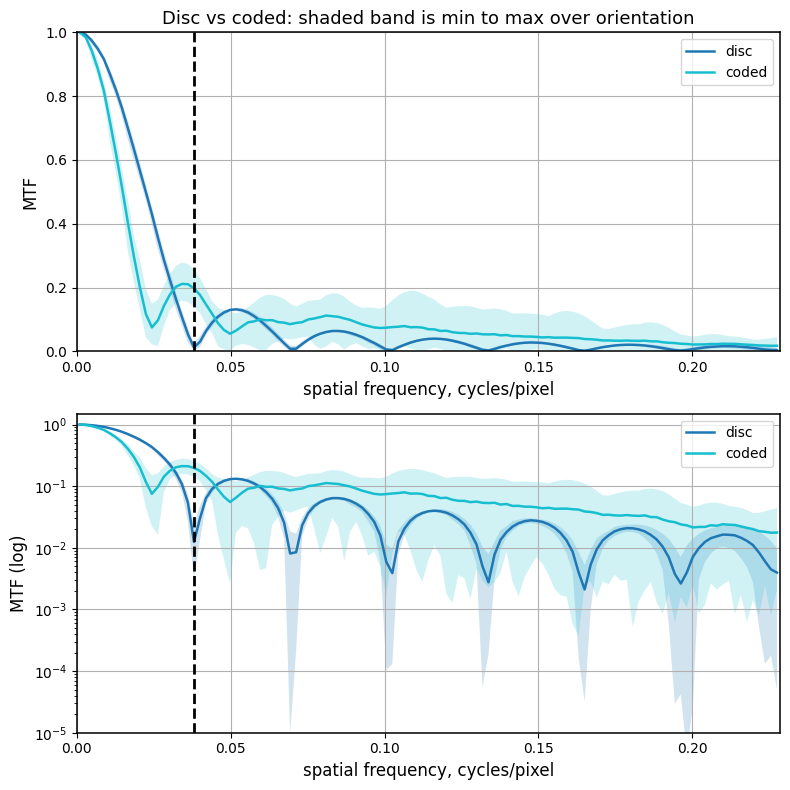

In [13]:
fr_c, lo_c, mid_c, hi_c = band_mtf(psf_coded, N)
XMAX = min(0.5, 6 * f_null_meas)

show_mtf_band([(fr, lo_d, mid_d, hi_d), (fr_c, lo_c, mid_c, hi_c)], ['disc', 'coded'],
              [0, XMAX, 1], 'Disc vs coded: shaded band is min to max over orientation',
              f_null_meas)

## 7. The coded aperture on the same two images

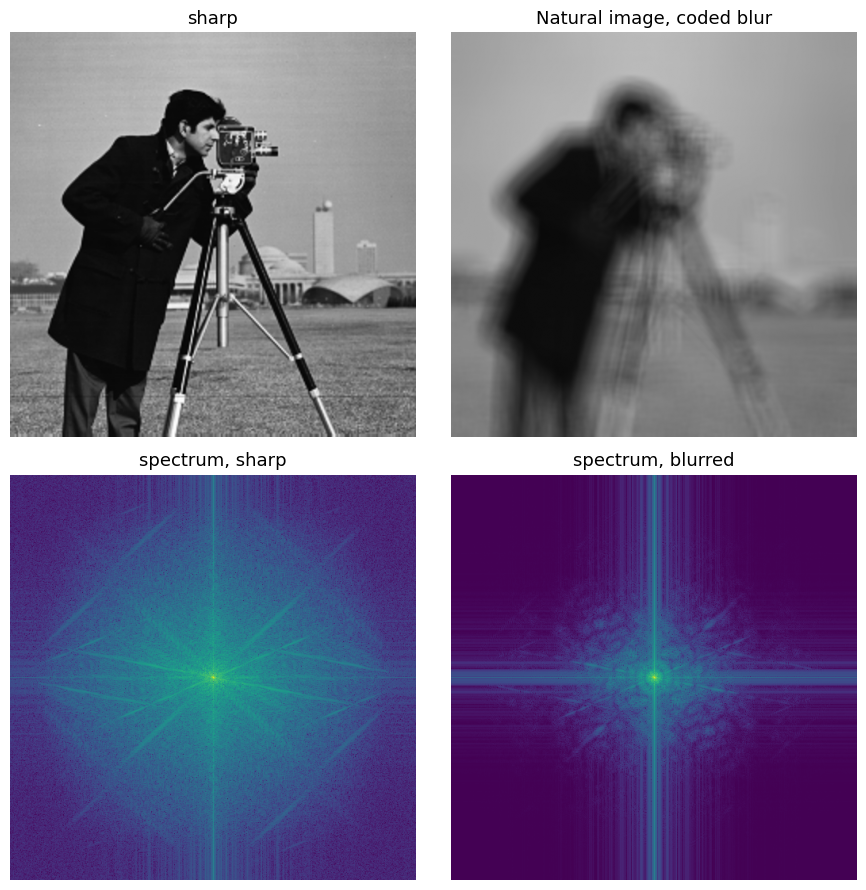

In [14]:
_ = show_image_demo(img, psf_coded, 'Natural image, coded blur', None)

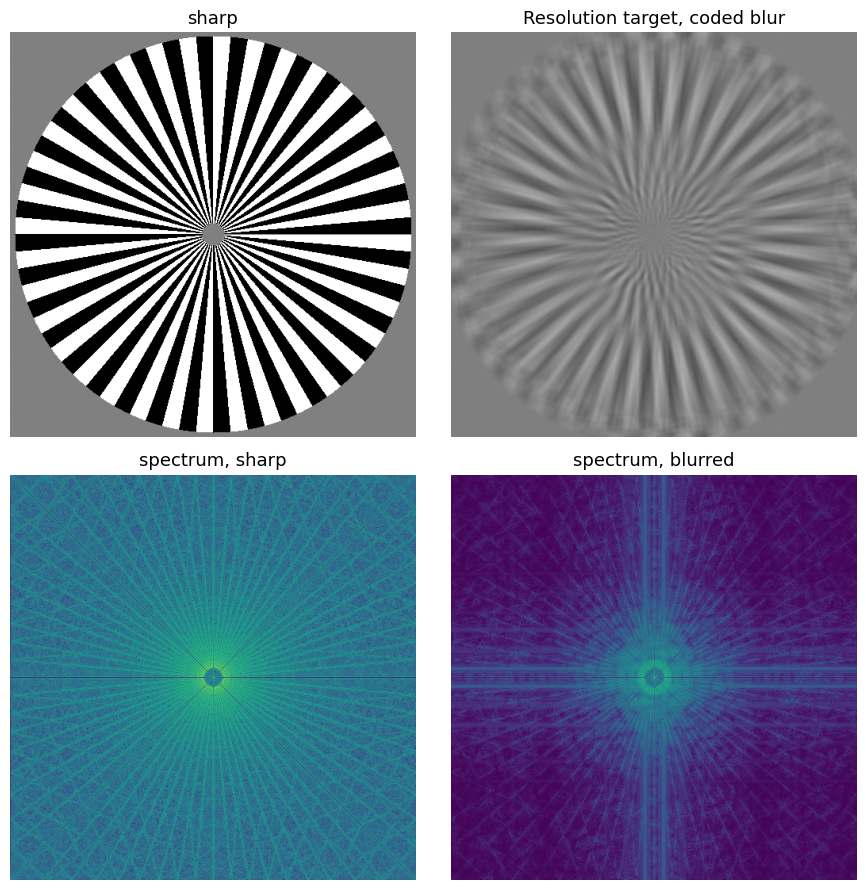

In [15]:
_ = show_image_demo(tgt, psf_coded, 'Resolution target, coded blur', None)

## 8. Naive deblurring: `Y = H X`, so try `X_hat = Y / H`

The forward model is a multiplication in the frequency domain, so the
naive inverse is just dividing by `H`. With no noise, this is exact. It
falls apart the moment there is noise, because it also divides the noise
by `H` — and anywhere `H` is small, that is a huge amplification.

disc, no noise                     : peak gain 1/min|H| = 1.15e+06 , RMSE of estimate = 2.01e-12


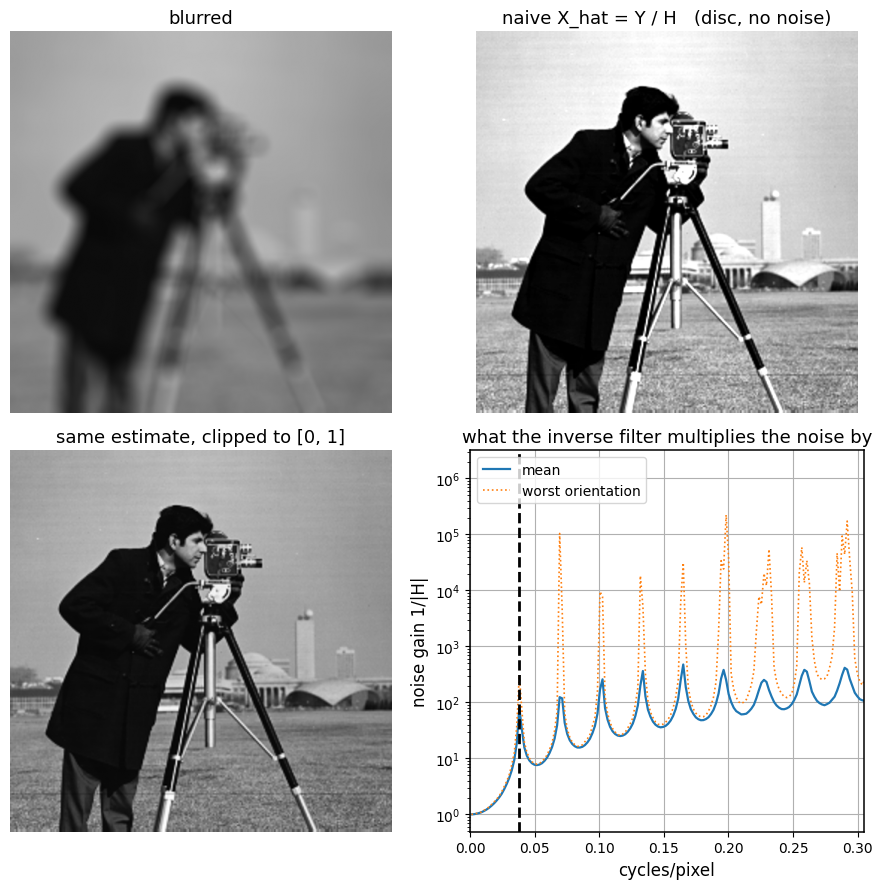

In [16]:
def show_naive(x, psf, sigma, title, fNull=None, seed=0):
    pad = psf.shape[0]
    xp = np.pad(x, pad, mode='symmetric')
    H = otf(psf, xp.shape[0])
    yp = np.real(np.fft.ifft2(np.fft.fft2(xp) * H))
    if sigma > 0:
        rng = np.random.default_rng(seed)
        yp = yp + sigma * rng.standard_normal(yp.shape)
    xhp = np.real(np.fft.ifft2(np.fft.fft2(yp) / H))

    def crop(a):
        return a[pad:pad + x.shape[0], pad:pad + x.shape[1]]
    y, xhat = crop(yp), crop(xhp)

    rmse = np.sqrt(np.mean((xhat - x)**2))
    print(f'{title:<34s} : peak gain 1/min|H| = {1 / np.min(np.abs(H)):.2e} , '
          f'RMSE of estimate = {rmse:.3g}')

    fig, axes = plt.subplots(2, 2, figsize=(9, 9))
    axes[0, 0].imshow(y, cmap='gray', vmin=0, vmax=1); axes[0, 0].axis('off')
    axes[0, 0].set_title('blurred' + (' + noise' if sigma > 0 else ''))

    lo, hi = robust_lim(xhat)
    axes[0, 1].imshow(xhat, cmap='gray', vmin=lo, vmax=hi); axes[0, 1].axis('off')
    axes[0, 1].set_title(f'naive X_hat = Y / H   ({title})')

    axes[1, 0].imshow(xhat, cmap='gray', vmin=0, vmax=1); axes[1, 0].axis('off')
    axes[1, 0].set_title('same estimate, clipped to [0, 1]')

    fr_p, lo_p, mid_p, _ = band_mtf(psf, x.shape[0])
    ax = axes[1, 1]
    ax.semilogy(fr_p, 1 / np.maximum(mid_p, 1e-12), lw=1.6, label='mean')
    ax.semilogy(fr_p, 1 / np.maximum(lo_p, 1e-12), ':', lw=1.2, label='worst orientation')
    if fNull is not None and not np.isnan(fNull):
        ax.axvline(fNull, color='k', ls='--')
    fxmax = 0.25 if (fNull is None or np.isnan(fNull)) else min(0.5, 8 * fNull)
    ax.set_xlim(0, fxmax)
    ax.set_xlabel('cycles/pixel'); ax.set_ylabel('noise gain 1/|H|')
    ax.legend(loc='upper left'); ax.grid(True)
    ax.set_title('what the inverse filter multiplies the noise by')
    plt.tight_layout(); plt.show()
    return xhat, rmse

_ = show_naive(img, psf_disc, 0, 'disc, no noise', f_null_meas)

Now add a very small amount of noise, `sigma = 1e-4` on a `[0, 1]` signal, and watch the naive inverse blow up:

disc, noise sigma = 0.0001         : peak gain 1/min|H| = 1.15e+06 , RMSE of estimate = 1.42


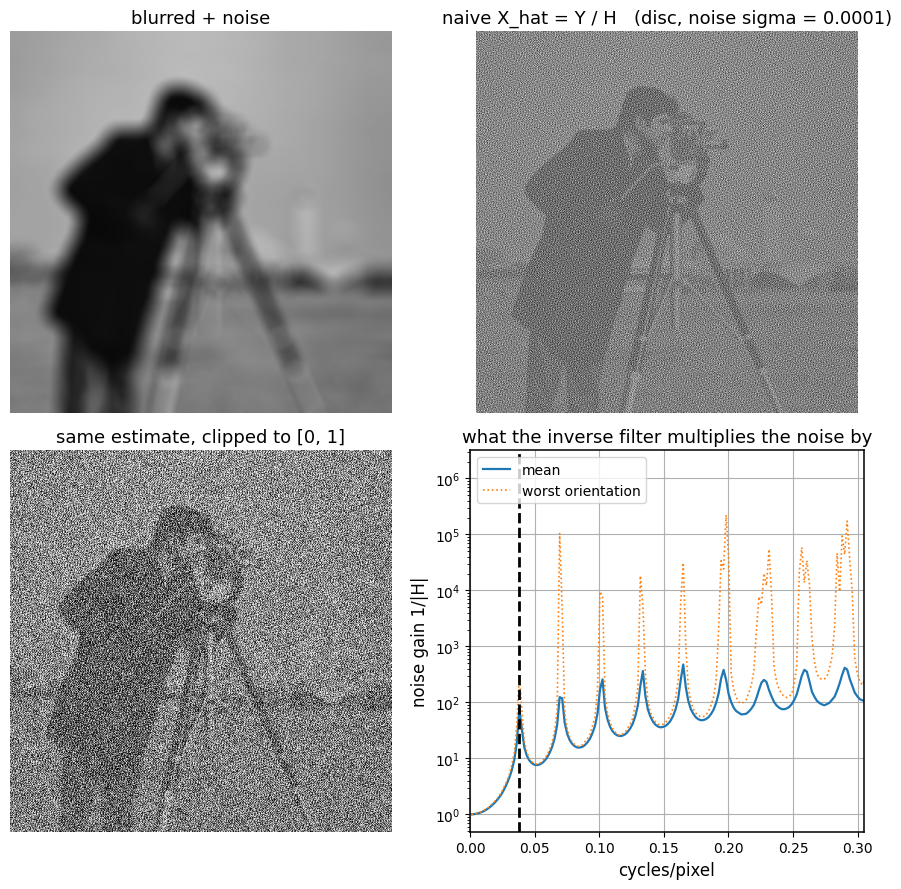

In [17]:
_ = show_naive(img, psf_disc, NoiseLevel, f'disc, noise sigma = {NoiseLevel:g}', f_null_meas)

On the resolution target you can see exactly *which* rings die — the ones outside the first null, where `1/|H|` has already diverged:

target, noise sigma = 0.0001       : peak gain 1/min|H| = 1.15e+06 , RMSE of estimate = 1.42


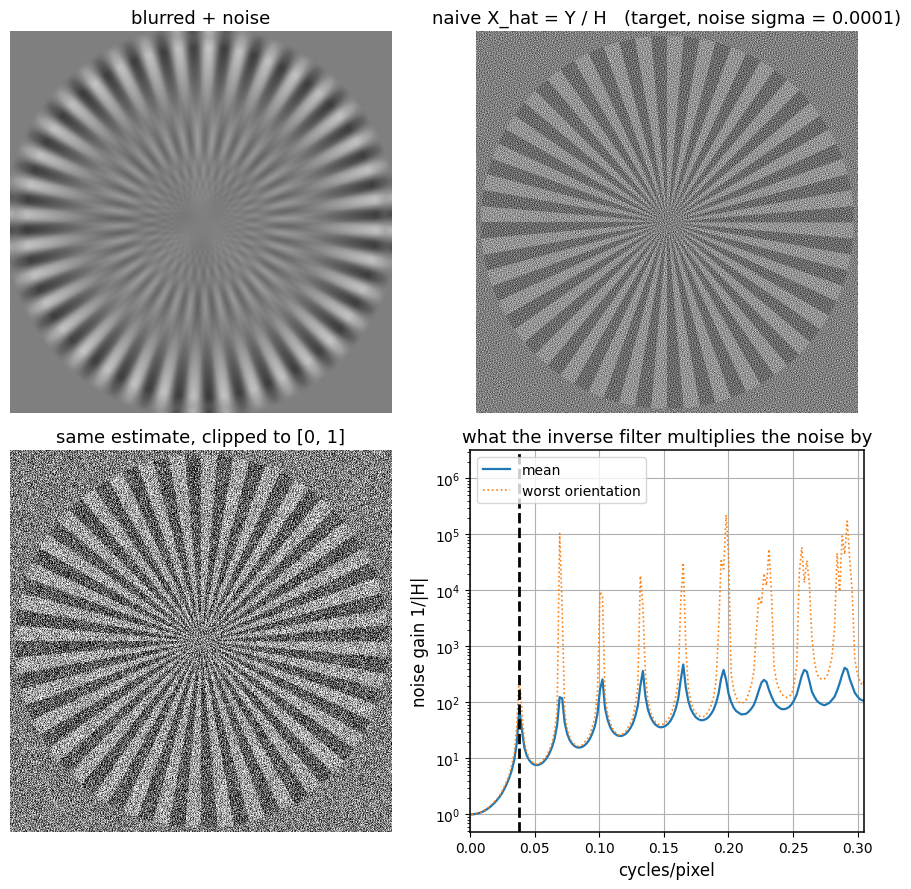

In [18]:
_ = show_naive(tgt, psf_disc, NoiseLevel, f'target, noise sigma = {NoiseLevel:g}', f_null_meas)

The same noise, but through the coded aperture. There is no true zero for `1/|H|` to divide by, so it is merely bad, not catastrophic:

coded, noise sigma = 0.0001        : peak gain 1/min|H| = 8.76e+04 , RMSE of estimate = 0.0744


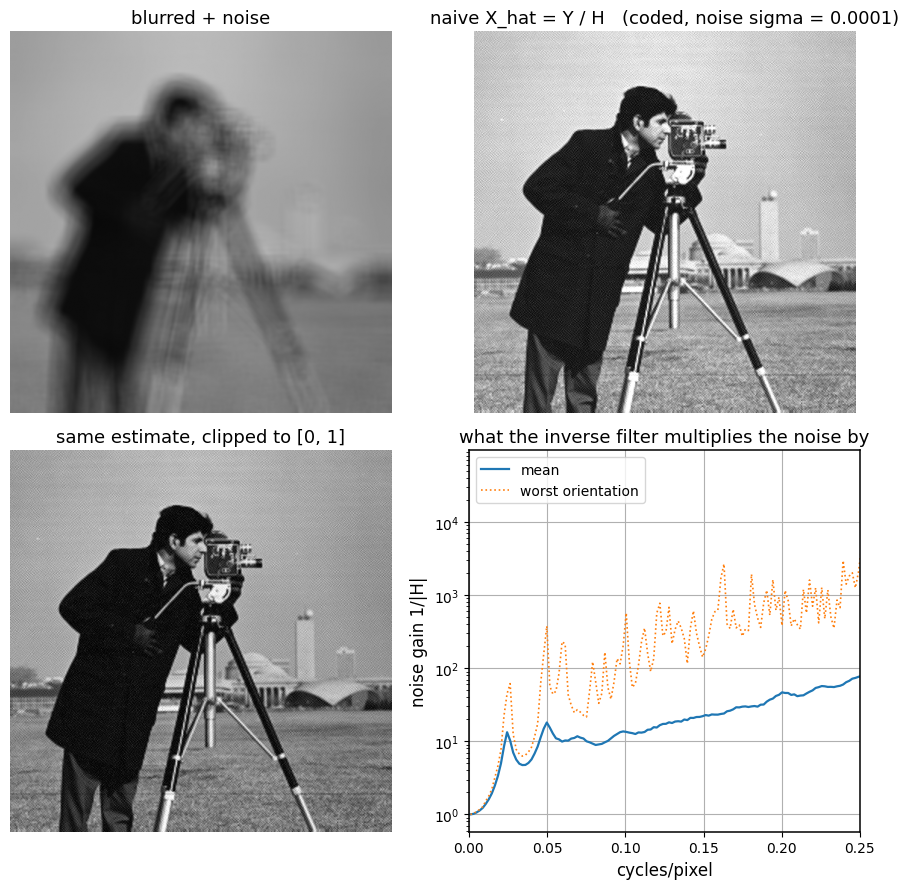

In [19]:
_ = show_naive(img, psf_coded, NoiseLevel, f'coded, noise sigma = {NoiseLevel:g}', None)

## 9. Why: the noise gain `1/|H|` against frequency

Plotting the MTF and its reciprocal (the noise gain) for both apertures on
the same axes makes the mechanism explicit: the disc's noise gain diverges
at its null, while the coded aperture's worst-orientation noise gain stays
bounded everywhere.

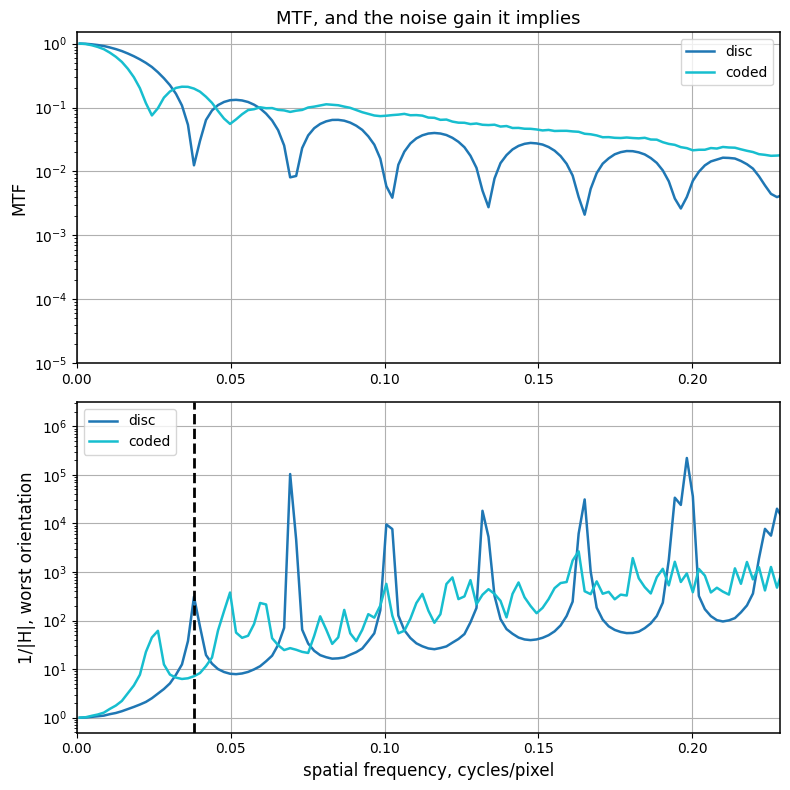

In [20]:
def compare_gain(psfs, labs, N, xmax, fNull=None):
    colors = plt.cm.tab10(np.linspace(0, 1, len(psfs)))
    fig, axes = plt.subplots(2, 1, figsize=(8, 8))

    ax = axes[0]
    for k, (psf, lab) in enumerate(zip(psfs, labs)):
        fr_p, _, mid_p, _ = band_mtf(psf, N)
        ax.plot(fr_p, np.maximum(mid_p, 1e-12), lw=1.8, color=colors[k], label=lab)
    ax.set_yscale('log'); ax.set_ylim(1e-5, 1.5); ax.set_xlim(0, xmax)
    ax.set_ylabel('MTF'); ax.set_title('MTF, and the noise gain it implies')
    ax.grid(True); ax.legend(loc='upper right')

    ax = axes[1]
    for k, (psf, lab) in enumerate(zip(psfs, labs)):
        fr_p, lo_p, _, _ = band_mtf(psf, N)
        ax.plot(fr_p, 1 / np.maximum(lo_p, 1e-12), lw=1.8, color=colors[k], label=lab)
    if fNull is not None and not np.isnan(fNull):
        ax.axvline(fNull, color='k', ls='--')
    ax.set_yscale('log'); ax.set_xlim(0, xmax)
    ax.set_xlabel('spatial frequency, cycles/pixel'); ax.set_ylabel('1/|H|, worst orientation')
    ax.grid(True); ax.legend(loc='upper left')
    plt.tight_layout(); plt.show()

compare_gain([psf_disc, psf_coded], ['disc', 'coded'], N, XMAX, f_null_meas)

## 10. The Wiener filter: stop dividing by tiny numbers

Instead of `X_hat = Y / H`, the Wiener filter uses

`W = conj(H) / (|H|^2 + K)`

`K` is a regularisation constant, effectively the noise-to-signal power
ratio. Where `|H|` is large, `W` behaves like the naive `1/H`. Where `|H|`
is small (or zero), `K` in the denominator caps the gain instead of
letting it diverge.

natural image, disc              naive RMSE 1.422 , Wiener RMSE 0.0403  (K = 2.0e-07)


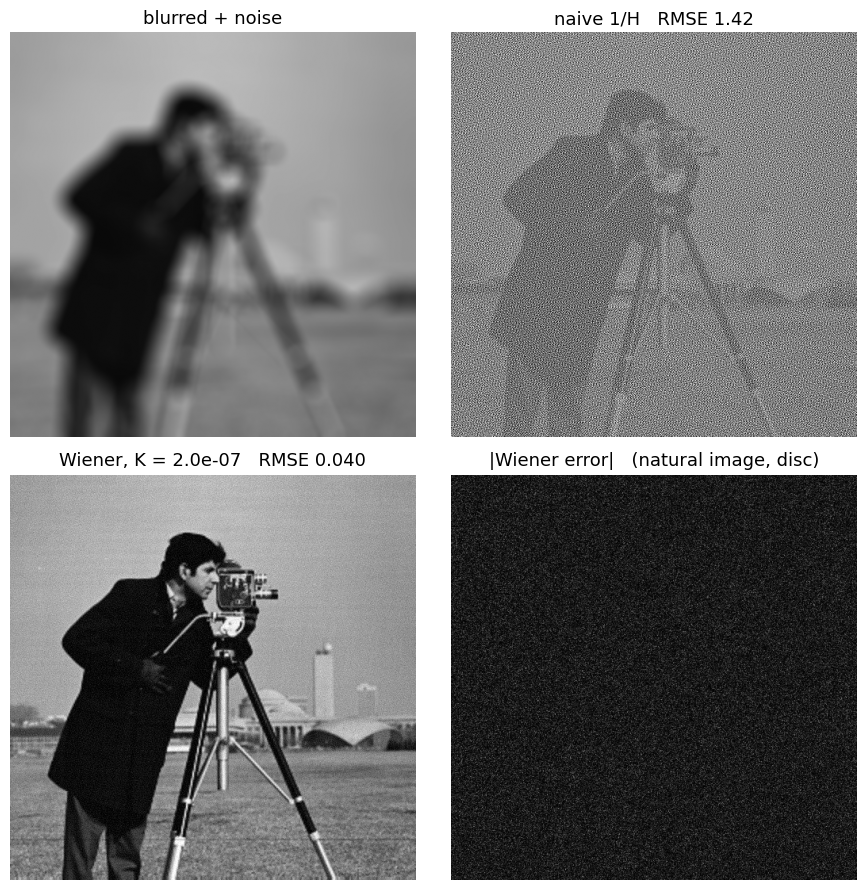

In [21]:
def wiener_cycle(x, psf, sigma, K, seed=0):
    '''Blur, add noise, then Wiener filter. K = None gives the naive inverse.'''
    pad = psf.shape[0]
    xp = np.pad(x, pad, mode='symmetric')
    H = otf(psf, xp.shape[0])
    rng = np.random.default_rng(seed)
    yp = np.real(np.fft.ifft2(np.fft.fft2(xp) * H))
    if sigma > 0:
        yp = yp + sigma * rng.standard_normal(yp.shape)
    Wf = 1 / H if K is None else np.conj(H) / (np.abs(H)**2 + K)
    xhp = np.real(np.fft.ifft2(Wf * np.fft.fft2(yp)))

    def crop(a):
        return a[pad:pad + x.shape[0], pad:pad + x.shape[1]]
    return crop(yp), crop(xhp), H


def show_wiener_vs_naive(x, psf, sigma, K, title, seed=0):
    y, xn, _ = wiener_cycle(x, psf, sigma, None, seed)
    _, xw, _ = wiener_cycle(x, psf, sigma, K, seed)
    rn = np.sqrt(np.mean((xn - x)**2))
    rw = np.sqrt(np.mean((xw - x)**2))
    print(f'{title:<32s} naive RMSE {rn:.4g} , Wiener RMSE {rw:.4f}  (K = {K:.1e})')

    fig, axes = plt.subplots(2, 2, figsize=(9, 9))
    axes[0, 0].imshow(y, cmap='gray', vmin=0, vmax=1); axes[0, 0].axis('off')
    axes[0, 0].set_title('blurred + noise')
    lo, hi = robust_lim(xn)
    axes[0, 1].imshow(xn, cmap='gray', vmin=lo, vmax=hi); axes[0, 1].axis('off')
    axes[0, 1].set_title(f'naive 1/H   RMSE {rn:.3g}')
    axes[1, 0].imshow(xw, cmap='gray', vmin=0, vmax=1); axes[1, 0].axis('off')
    axes[1, 0].set_title(f'Wiener, K = {K:.1e}   RMSE {rw:.3f}')
    axes[1, 1].imshow(np.abs(xw - x), cmap='gray', vmin=0, vmax=0.3); axes[1, 1].axis('off')
    axes[1, 1].set_title(f'|Wiener error|   ({title})')
    plt.tight_layout(); plt.show()

K0 = 2e-7   # a reasonable starting point
show_wiener_vs_naive(img, psf_disc, NoiseLevel, K0, 'natural image, disc')

resolution target, disc          naive RMSE 1.422 , Wiener RMSE 0.0487  (K = 2.0e-07)


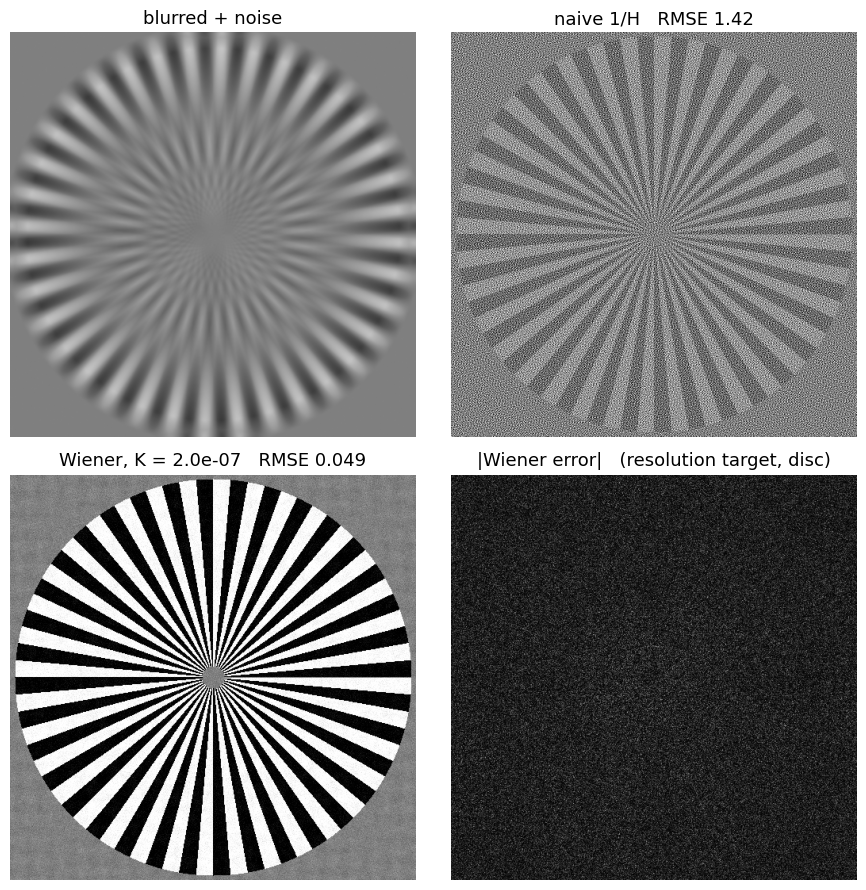

In [22]:
show_wiener_vs_naive(tgt, psf_disc, NoiseLevel, K0, 'resolution target, disc')

## 11. Sweep K and watch the error turn around

`K` too small reduces to the naive filter (noise dominates); `K` too large
suppresses noise but also suppresses genuine high-frequency signal
(over-smoothing). Somewhere in between is a minimum-RMSE sweet spot.

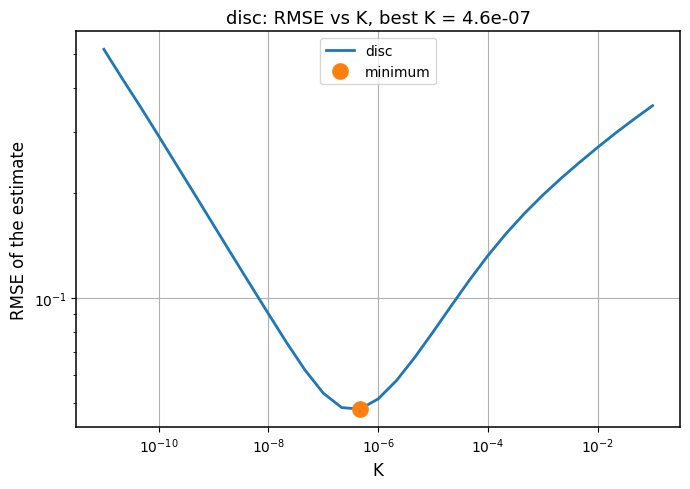

disc : best K = 4.64e-07, RMSE 0.0479


In [23]:
def sweep_k(x, psf, sigma, Ks, lab, seed=0):
    rmse = np.zeros(len(Ks))
    for i, K in enumerate(Ks):
        _, xh, _ = wiener_cycle(x, psf, sigma, K, seed)
        rmse[i] = np.sqrt(np.mean((xh - x)**2))
    i = int(np.argmin(rmse))
    Kbest = Ks[i]

    fig, ax = plt.subplots(figsize=(7, 5))
    ax.loglog(Ks, rmse, lw=2, label=lab)
    ax.loglog(Kbest, rmse[i], 'o', ms=10, mew=2, label='minimum')
    ax.set_xlabel('K'); ax.set_ylabel('RMSE of the estimate')
    ax.set_title(f'{lab}: RMSE vs K, best K = {Kbest:.1e}')
    ax.grid(True); ax.legend(loc='upper center')
    plt.tight_layout(); plt.show()
    return Kbest, rmse

Ks = np.logspace(-11, -1, 31)
Kbest_d, r_d = sweep_k(tgt, psf_disc, NoiseLevel, Ks, 'disc')
print(f'disc : best K = {Kbest_d:.2e}, RMSE {r_d.min():.4f}')

Three values of K, side by side, showing the too-small / about-right / too-large regimes directly:

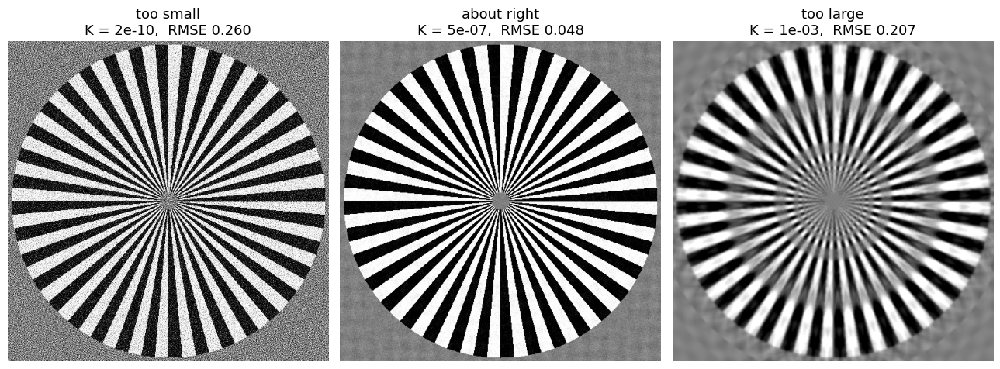

In [24]:
def show_k_triple(x, psf, sigma, Ks, seed=0):
    names = ['too small', 'about right', 'too large']
    fig, axes = plt.subplots(1, 3, figsize=(13, 5))
    for i, (K, name) in enumerate(zip(Ks, names)):
        _, xh, _ = wiener_cycle(x, psf, sigma, K, seed)
        r = np.sqrt(np.mean((xh - x)**2))
        axes[i].imshow(xh, cmap='gray', vmin=0, vmax=1); axes[i].axis('off')
        axes[i].set_title(f'{name}\nK = {K:.0e},  RMSE {r:.3f}')
    plt.tight_layout(); plt.show()

show_k_triple(tgt, psf_disc, NoiseLevel, [Kbest_d / 3000, Kbest_d, Kbest_d * 3000])

## 12. The coded aperture under Wiener

Repeat the K sweep for the coded aperture. Because its noise gain never
diverges, its best achievable RMSE should beat the disc's.

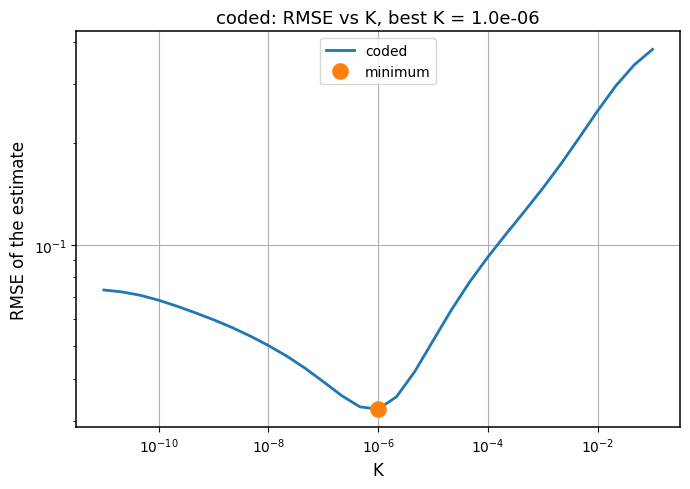

coded: best K = 1.00e-06, RMSE 0.0325   (disc 0.0479, so 32% better)


In [25]:
Kbest_c, r_c = sweep_k(tgt, psf_coded, NoiseLevel, Ks, 'coded')
print(f'coded: best K = {Kbest_c:.2e}, RMSE {r_c.min():.4f}   '
      f'(disc {r_d.min():.4f}, so {100 * (r_d.min() - r_c.min()) / r_d.min():.0f}% better)')

Disc vs coded, both Wiener-deblurred at their own best K, side by side:

Wiener, disc RMSE 0.0479 (K=4.6e-07) vs coded RMSE 0.0325 (K=1.0e-06)  -> 32% better


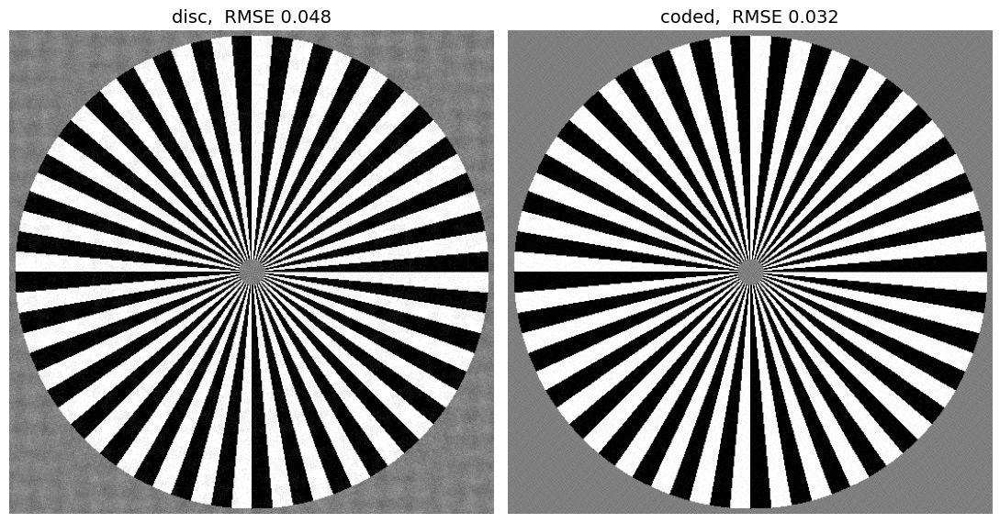

In [26]:
def show_wiener_pair(x, psfA, psfB, sigma, KA, KB, labA, labB, seed=0):
    _, xa, _ = wiener_cycle(x, psfA, sigma, KA, seed)
    _, xb, _ = wiener_cycle(x, psfB, sigma, KB, seed)
    ra = np.sqrt(np.mean((xa - x)**2)); rb = np.sqrt(np.mean((xb - x)**2))
    print(f'Wiener, {labA} RMSE {ra:.4f} (K={KA:.1e}) vs {labB} RMSE {rb:.4f} (K={KB:.1e})  '
          f'-> {100 * (ra - rb) / ra:.0f}% better')

    fig, axes = plt.subplots(1, 2, figsize=(11, 6))
    axes[0].imshow(xa, cmap='gray', vmin=0, vmax=1); axes[0].axis('off')
    axes[0].set_title(f'{labA},  RMSE {ra:.3f}', fontsize=14)
    axes[1].imshow(xb, cmap='gray', vmin=0, vmax=1); axes[1].axis('off')
    axes[1].set_title(f'{labB},  RMSE {rb:.3f}', fontsize=14)
    plt.tight_layout(); plt.show()

show_wiener_pair(tgt, psf_disc, psf_coded, NoiseLevel, Kbest_d, Kbest_c, 'disc', 'coded')

Wiener, disc RMSE 0.0322 (K=4.6e-07) vs coded RMSE 0.0245 (K=1.0e-06)  -> 24% better


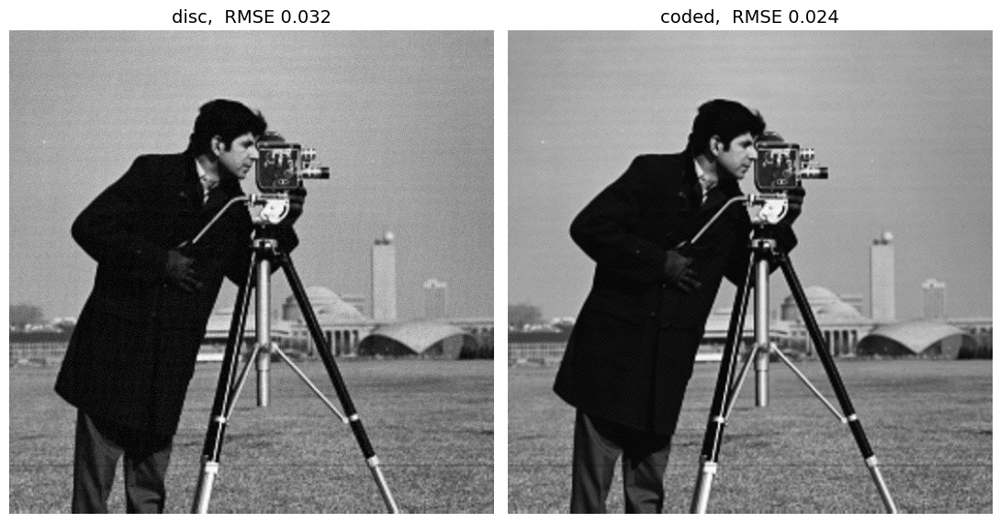

In [27]:
show_wiener_pair(img, psf_disc, psf_coded, NoiseLevel, Kbest_d, Kbest_c, 'disc', 'coded')

Both RMSE-vs-K curves together:

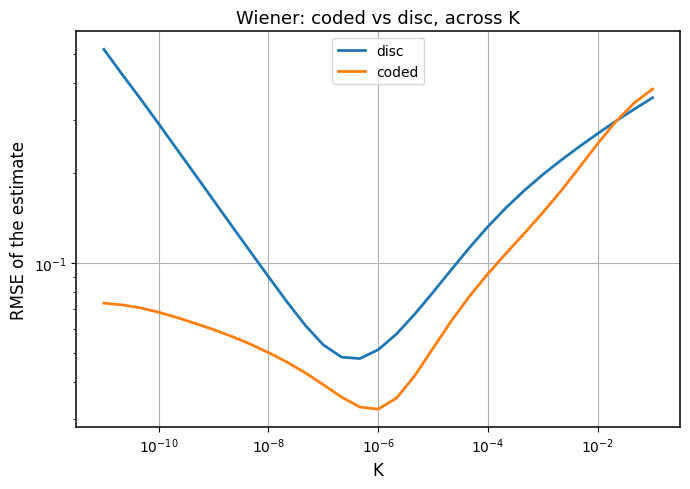

In [28]:
def show_two_sweeps(Ks, r1, r2, labs):
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.loglog(Ks, r1, lw=2, label=labs[0])
    ax.loglog(Ks, r2, lw=2, label=labs[1])
    ax.set_xlabel('K'); ax.set_ylabel('RMSE of the estimate')
    ax.set_title('Wiener: coded vs disc, across K')
    ax.grid(True); ax.legend(loc='upper center')
    plt.tight_layout(); plt.show()

show_two_sweeps(Ks, r_d, r_c, ['disc', 'coded'])

## 13. Optional: spatial-domain deconvolution, and why nobody does it that way

The Wiener filter can be written as a spatial convolution kernel,
`w = ifft2(W)`. Doing the deconvolution as an explicit convolution with the
*full* kernel gives exactly the same answer as the FFT route (they are the
same linear operation, expressed two ways) — but it costs `O(N^2 M^2)`
against the FFT's `O(N^2 log N^2)`, where `M` is the kernel size. Spatial
convolution only wins when the kernel can be truncated to something much
smaller than the image, and for these coded-aperture Wiener kernels it
generally can't be: their energy is spread out, not concentrated near the
centre. This section is exploratory and is skipped by default; run the
cells below if you want to see it.

kernel: centre +0.061, min -0.068, max +0.079, sum 0.9901


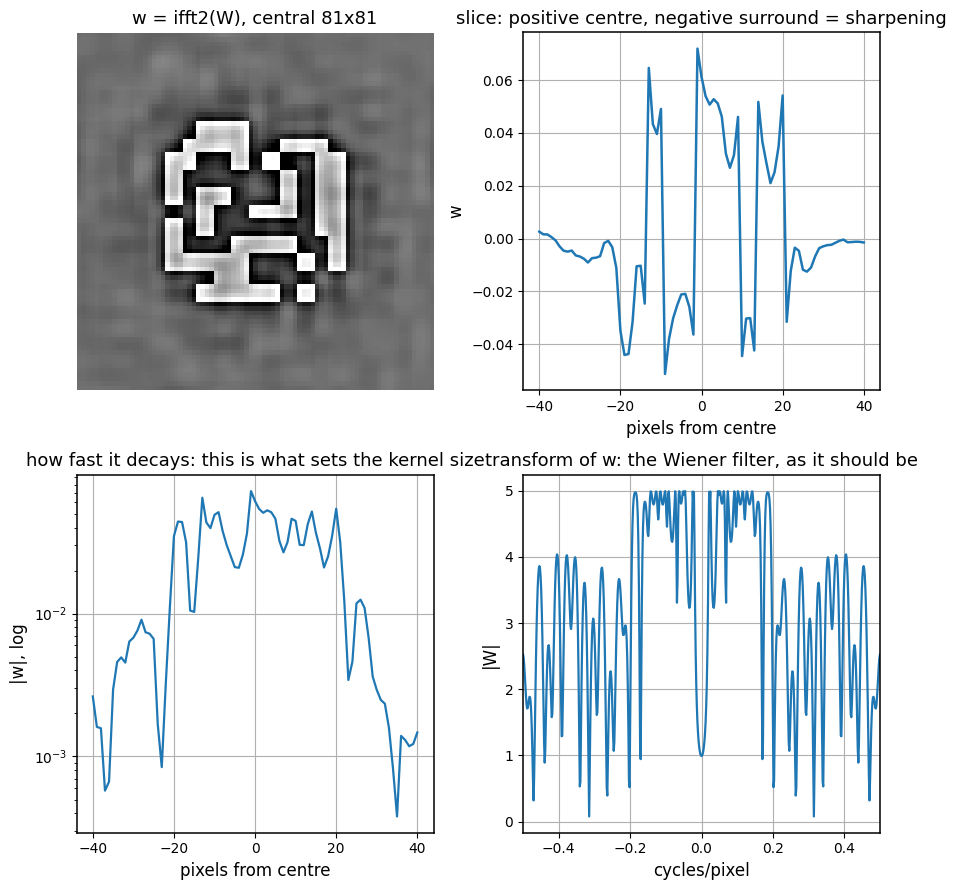

In [29]:
def wiener_kernel(psf, K, Np):
    H = otf(psf, Np)
    W = np.conj(H) / (np.abs(H)**2 + K)
    return np.real(np.fft.fftshift(np.fft.ifft2(W)))


def odd_size(n):
    '''Force an odd transform size so fftshift centres the kernel on a real pixel.'''
    return n + 1 if n % 2 == 0 else n


def show_spatial_kernel(psf, K, N):
    pad = psf.shape[0]
    Np = odd_size(N + 2 * pad)
    w = wiener_kernel(psf, K, Np)
    c = Np // 2
    hw = 40
    patch = w[c - hw:c + hw + 1, c - hw:c + hw + 1]

    print(f'kernel: centre {w[c, c]:+.3f}, min {w.min():+.3f}, max {w.max():+.3f}, sum {w.sum():.4f}')

    fig, axes = plt.subplots(2, 2, figsize=(9, 9))
    lo, hi = robust_lim(patch)
    axes[0, 0].imshow(patch, cmap='gray', vmin=lo, vmax=hi); axes[0, 0].axis('off')
    axes[0, 0].set_title(f'w = ifft2(W), central {2*hw+1}x{2*hw+1}')

    axes[0, 1].plot(np.arange(-hw, hw + 1), w[c, c - hw:c + hw + 1], lw=1.8); axes[0, 1].grid(True)
    axes[0, 1].set_xlabel('pixels from centre'); axes[0, 1].set_ylabel('w')
    axes[0, 1].set_title('slice: positive centre, negative surround = sharpening')

    axes[1, 0].semilogy(np.arange(-hw, hw + 1),
                         np.maximum(np.abs(w[c, c - hw:c + hw + 1]), 1e-8), lw=1.6)
    axes[1, 0].grid(True)
    axes[1, 0].set_xlabel('pixels from centre'); axes[1, 0].set_ylabel('|w|, log')
    axes[1, 0].set_title('how fast it decays: this is what sets the kernel size')

    Wback = np.abs(np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(w))))
    axes[1, 1].plot(np.linspace(-0.5, 0.5, Np), Wback[c, :], lw=1.6); axes[1, 1].grid(True)
    axes[1, 1].set_xlim(-0.5, 0.5)
    axes[1, 1].set_xlabel('cycles/pixel'); axes[1, 1].set_ylabel('|W|')
    axes[1, 1].set_title('transform of w: the Wiener filter, as it should be')
    plt.tight_layout(); plt.show()

show_spatial_kernel(psf_coded, 1e-2, N)

In [30]:
def report_compactness(psf, N, Ks):
    '''How much of the kernel's energy sits within a given radius. A kernel you
    can crop is one whose energy is concentrated; the naive inverse filter's is not.'''
    pad = psf.shape[0]
    Np = odd_size(N + 2 * pad)
    H = otf(psf, Np)
    c = Np // 2
    idx = np.arange(Np) - c
    xx, yy = np.meshgrid(idx, idx)
    rr = np.hypot(xx, yy)
    print('\nfraction of kernel energy within radius r:')
    print(f'   {"filter":<16s} {"r<=8":>8s} {"r<=16":>8s} {"r<=32":>8s} {"r<=64":>8s}')
    entries = [(None, 'naive 1/H')] + [(K, f'Wiener K={K:.0e}') for K in Ks]
    for K, lab in entries:
        W = 1 / H if K is None else np.conj(H) / (np.abs(H)**2 + K)
        w = np.real(np.fft.fftshift(np.fft.ifft2(W)))
        tot = np.sum(w**2)
        frac = lambda R: np.sum(w[rr <= R]**2) / tot
        print(f'   {lab:<16s} {frac(8):8.4f} {frac(16):8.4f} {frac(32):8.4f} {frac(64):8.4f}')
    print('   a kernel you can crop is one with its energy near the centre.\n'
          '   the naive filter spreads its energy everywhere, which is the real\n'
          '   reason the spatial route only works "sometimes".')

report_compactness(psf_coded, N, [1e-4, 1e-2])


fraction of kernel energy within radius r:
   filter               r<=8    r<=16    r<=32    r<=64
   naive 1/H          0.0138   0.0565   0.1510   0.2514
   Wiener K=1e-04     0.0830   0.4127   0.9182   0.9842
   Wiener K=1e-02     0.0937   0.4279   0.9792   0.9967
   a kernel you can crop is one with its energy near the centre.
   the naive filter spreads its energy everywhere, which is the real
   reason the spatial route only works "sometimes".



full-kernel spatial vs FFT, 129x129 patch, K = 1e-03
   max |spatial - FFT| = 1.72e-14   (image range -0.04 to 0.98)
   same operation, machine precision apart
   cost: spatial 2.77e+08 ops, FFT 4.67e+05 ops  ->  593x


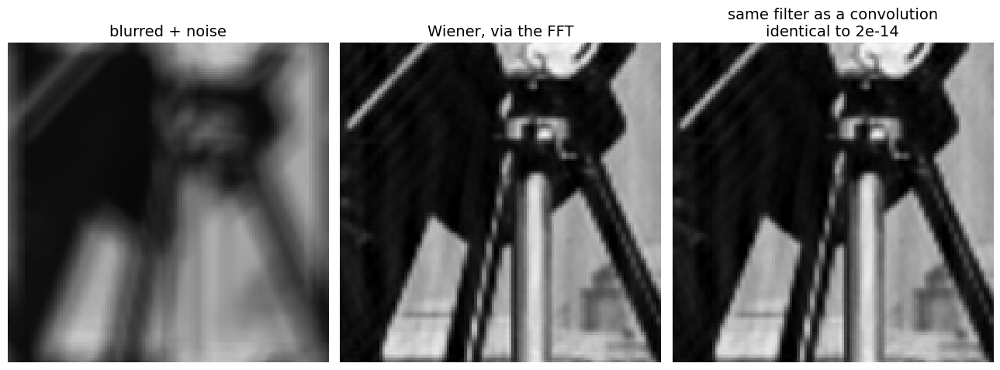

In [31]:
def show_spatial_exact(x, psf, sigma, K, P=129, seed=0):
    '''Wiener by FFT vs the same filter as an explicit spatial convolution with
    the FULL kernel, on a small patch (the full kernel is as big as the image).
    Everything here is circular, so the two routes agree to machine precision.'''
    if P % 2 == 0:
        P += 1
    o = (x.shape[0] - P) // 2
    xp = x[o:o + P, o:o + P]

    H = otf(psf, P)
    rng = np.random.default_rng(seed)
    y = np.real(np.fft.ifft2(np.fft.fft2(xp) * H)) + sigma * rng.standard_normal((P, P))
    W = np.conj(H) / (np.abs(H)**2 + K)
    exact = np.real(np.fft.ifft2(W * np.fft.fft2(y)))
    w = np.real(np.fft.fftshift(np.fft.ifft2(W)))

    c = P // 2
    acc = np.zeros((P, P))
    nz = np.argwhere(w != 0)
    for i, j in nz:
        acc += w[i, j] * np.roll(y, shift=(i - c, j - c), axis=(0, 1))

    d = acc - exact
    sp_ops = P**4
    fft_ops = 2 * P * P * np.log2(P * P)
    print(f'\nfull-kernel spatial vs FFT, {P}x{P} patch, K = {K:.0e}')
    print(f'   max |spatial - FFT| = {np.max(np.abs(d)):.2e}   '
          f'(image range {exact.min():.2f} to {exact.max():.2f})')
    print('   same operation, machine precision apart')
    print(f'   cost: spatial {sp_ops:.2e} ops, FFT {fft_ops:.2e} ops  ->  {sp_ops / fft_ops:.0f}x')

    fig, axes = plt.subplots(1, 3, figsize=(13, 5))
    axes[0].imshow(y, cmap='gray', vmin=0, vmax=1); axes[0].axis('off')
    axes[0].set_title('blurred + noise', fontsize=14)
    axes[1].imshow(exact, cmap='gray', vmin=0, vmax=1); axes[1].axis('off')
    axes[1].set_title('Wiener, via the FFT', fontsize=14)
    axes[2].imshow(acc, cmap='gray', vmin=0, vmax=1); axes[2].axis('off')
    axes[2].set_title(f'same filter as a convolution\nidentical to {np.max(np.abs(d)):.0e}', fontsize=14)
    plt.tight_layout(); plt.show()

pc13, _ = coded_psf(13, CMP)
show_spatial_exact(img, pc13, NoiseLevel, 1e-3, 129)

In [32]:
def report_spatial_cost(Ns):
    print('\nfull-kernel spatial convolution vs the FFT:')
    print(f'   {"image":>8s} {"spatial":>12s} {"FFT":>12s} {"ratio":>10s}')
    for Nv in Ns:
        sp = Nv**4
        ff = 2 * Nv * Nv * np.log2(Nv * Nv)
        print(f'   {Nv:5d}x{Nv:<4d} {sp:12.2e} {ff:12.2e} {sp / ff:9.0f}x')
    print('   a compact kernel changes M^2 from N^2 to something small, which is')
    print('   the only way spatial wins - and for this filter no compact kernel')
    print('   is accurate enough.')

report_spatial_cost([129, 512, 1024, 4096])


full-kernel spatial convolution vs the FFT:
      image      spatial          FFT      ratio
     129x129      2.77e+08     4.67e+05       593x
     512x512      6.87e+10     9.44e+06      7282x
    1024x1024     1.10e+12     4.19e+07     26214x
    4096x4096     2.81e+14     8.05e+08    349525x
   a compact kernel changes M^2 from N^2 to something small, which is
   the only way spatial wins - and for this filter no compact kernel
   is accurate enough.
